In [9]:
import numpy as np

import matplotlib.pyplot as plt

import scipy.signal

import time

In [2]:
np.__version__

'1.23.5'

$$\theta(x,t;k) = xk + 4k^3t$$

# <font color=blue> <center> Using vectorize, always specify the otypes </center></font>

vectorize is slow

use 

np.where
np.any
np.all
instead

In [10]:
def find_x0_t0(soliton1, soliton2):
    kappa1, gamma1 = soliton1
    kappa2, gamma2 = soliton2
    
    Mat = np.zeros((2, 3))
    Mat[0][0] = 1 
    Mat[0][1] = -4*kappa1**2
    Mat[0][2] = 1/(2*kappa1) * np.log(gamma1**2 / (2*kappa1)) - 1/(2*kappa1)*np.log((kappa1+kappa2)/(kappa1-kappa2))
    
    Mat[1][0] = 1 
    Mat[1][1] = -4*kappa2**2
    Mat[1][2] = 1/(2*kappa2) * np.log(gamma2**2 / (2*kappa2)) - 1/(2*kappa2)*np.log((kappa1+kappa2)/(kappa1-kappa2))
    
    x0, t0 = np.linalg.solve(Mat[:, :2], Mat[:, 2])
    
    return (x0, t0)

In [6]:
# don't use

def defineMwhole(theta1, kappa1, gamma1, theta2, kappa2, gamma2):
    Mat = np.zeros((2, 3))
    if ( theta1 <= 0 ):
        exp1 = np.exp(theta1)
        Mat[0, 0] = 1 + exp1 * gamma1**2 / (2*kappa1)
        Mat[0, 1] = exp1 * gamma1**2 / (kappa1 + kappa2)
        Mat[0, 2] = gamma1**2 * exp1
    else:
        exp1 = np.exp(-theta1)
        Mat[0, 0] = exp1 + gamma1**2 / (2*kappa1)
        Mat[0, 1] = gamma1**2 / (kappa1 + kappa2)
        Mat[0, 2] = gamma1**2
        
    
    if ( theta2 <= 0 ):
        exp2 = np.exp(theta2)
        Mat[1, 0] = exp2 * gamma2**2 / (kappa1 + kappa2)
        Mat[1, 1] = 1 + exp2 * gamma2**2 / (2*kappa2)
        Mat[1, 2] = gamma2**2 * exp2
    else:
        exp2 = np.exp(-theta2)
        Mat[1, 0] = gamma2**2 / (kappa1 + kappa2)
        Mat[1, 1] = exp2 + gamma2**2 / (2*kappa2)
        Mat[1, 2] = gamma2**2
        
    return Mat

In [29]:
Mat.shape

(100, 1000, 2, 3)

In [3]:
# don't use
# Program with vectorized
start = time.time()

kappa1 = 1; gamma1 = 3;
kappa2 = 0.75; gamma2 = 4;


mysum = 0

xinter, tinter = find_x0_t0((kappa1, gamma1), (kappa2, gamma2))


tarr = np.linspace(tinter, tinter + 3/kappa1, 100)
Nx = 1000
xarr = np.linspace(xinter - 10/kappa1, xinter + 10/kappa1, Nx)
uarr = np.zeros(Nx)



#Mat = np.zeros((tarr.shape[0], xarr.shape[0], 2, 3), dtype=float)
Mat = np.zeros((tarr.shape[0], xarr.shape[0], 2, 3), dtype=float)

theta1 = -2 * kappa1 * xarr.reshape(1, -1) + 8 * kappa1**3 * tarr.reshape(-1, 1)
theta2 = -2 * kappa2 * xarr.reshape(1, -1) + 8 * kappa2**3 * tarr.reshape(-1, 1)


#Mat[:, :, 0, 0] = np.vectorize(defineM00, otypes=[float])(theta1, kappa1, gamma1)
#Mat[:, :, 0, 1] = np.vectorize(defineM01, otypes=[float])(theta1, kappa1, kappa2, gamma1)
#Mat[:, :, 0, 2] = np.vectorize(defineM02, otypes=[float])(theta1, kappa1, gamma1)

#Mat[:, :, 1, 0] = np.vectorize(defineM10, otypes=[float])(theta2, kappa1, kappa2, gamma2)
#Mat[:, :, 1, 1] = np.vectorize(defineM11, otypes=[float])(theta2, kappa2, gamma2)
#Mat[:, :, 1, 2] = np.vectorize(defineM12, otypes=[float])(theta2, kappa2, gamma2)


#Mat = np.vectorize(defineMwhole, signature='(), (), (), (), (), ()->(m, n)', otypes=[float])\
#(theta1, kappa1, gamma1, theta2, kappa2, gamma2)


exp1 = np.where(theta1 <= 0, np.exp(theta1), np.exp(-theta1))
exp2 = np.where(theta2 <= 0, np.exp(theta2), np.exp(-theta2))


Mat[:, :, 0, 0] = np.where(theta1 <= 0, 1 + exp1 * gamma1**2 / (2*kappa1), exp1 + gamma1**2 / (2*kappa1))
Mat[:, :, 0, 1] = np.where(theta1 <= 0, exp1 * gamma1**2 / (kappa1 + kappa2), gamma1**2 / (kappa1 + kappa2))
Mat[:, :, 0, 2] = np.where(theta1 <= 0, gamma1**2 * exp1, gamma1**2)

Mat[:, :, 1, 0] = np.where(theta2 <= 0, exp2 * gamma2**2 / (kappa1 + kappa2), gamma2**2 / (kappa1 + kappa2))
Mat[:, :, 1, 1] = np.where(theta2 <= 0, 1 + exp2 * gamma2**2 / (2*kappa2), exp2 + gamma2**2 / (2*kappa2))
Mat[:, :, 1, 2] = np.where(theta2 <= 0, gamma2**2 * exp2, gamma2**2)

#mysum += np.sum(np.abs(Mat - Matalt))

alphas = np.linalg.solve(Mat[:, :, :, :2], Mat[:, :, :, 2].reshape(Mat.shape[:-1] + (1,)))
u = 4 * (alphas[:, :, 0] * kappa1 + alphas[:, :, 1] * kappa2) - 2 * (alphas[:, :, 0] + alphas[:, :, 1])**2

u = u.squeeze()
#print(Mat)
#print(alphas)

end = time.time()
print(end - start)

0.02663898468017578


In [56]:
#mysum

0.0

In [4]:
u.shape

(100, 1000)

In [15]:
# Program with np.where
start = time.time()

kappa1 = 2; gamma1 = 7;
kappa2 = 1.5; gamma2 = 9;


xinter, tinter = find_x0_t0((kappa1, gamma1), (kappa2, gamma2))


tarr = np.linspace(tinter, tinter + 3/kappa1, 100)
Nx = 10000
xarr = np.linspace(xinter - 10/kappa1, xinter + 10/kappa1, Nx)
uarr = np.zeros(Nx)


Mat = np.zeros((tarr.shape[0], xarr.shape[0], 2, 3), dtype=float)

theta1 = -2 * kappa1 * xarr.reshape(1, -1) + 8 * kappa1**3 * tarr.reshape(-1, 1)
theta2 = -2 * kappa2 * xarr.reshape(1, -1) + 8 * kappa2**3 * tarr.reshape(-1, 1)


#Mat[:, :, 0, 0] = np.vectorize(defineM00, otypes=[float])(theta1, kappa1, gamma1)
#Mat[:, :, 0, 1] = np.vectorize(defineM01, otypes=[float])(theta1, kappa1, kappa2, gamma1)
#Mat[:, :, 0, 2] = np.vectorize(defineM02, otypes=[float])(theta1, kappa1, gamma1)

#Mat[:, :, 1, 0] = np.vectorize(defineM10, otypes=[float])(theta2, kappa1, kappa2, gamma2)
#Mat[:, :, 1, 1] = np.vectorize(defineM11, otypes=[float])(theta2, kappa2, gamma2)
#Mat[:, :, 1, 2] = np.vectorize(defineM12, otypes=[float])(theta2, kappa2, gamma2)


#Mat = np.vectorize(defineMwhole, signature='(), (), (), (), (), ()->(m, n)', otypes=[float])\
#(theta1, kappa1, gamma1, theta2, kappa2, gamma2)


exp1 = np.where(theta1 <= 0, np.exp(theta1), np.exp(-theta1))
exp2 = np.where(theta2 <= 0, np.exp(theta2), np.exp(-theta2))


Mat[:, :, 0, 0] = np.where(theta1 <= 0, 1 + exp1 * gamma1**2 / (2*kappa1), exp1 + gamma1**2 / (2*kappa1))
Mat[:, :, 0, 1] = np.where(theta1 <= 0, exp1 * gamma1**2 / (kappa1 + kappa2), gamma1**2 / (kappa1 + kappa2))
Mat[:, :, 0, 2] = np.where(theta1 <= 0, gamma1**2 * exp1, gamma1**2)

Mat[:, :, 1, 0] = np.where(theta2 <= 0, exp2 * gamma2**2 / (kappa1 + kappa2), gamma2**2 / (kappa1 + kappa2))
Mat[:, :, 1, 1] = np.where(theta2 <= 0, 1 + exp2 * gamma2**2 / (2*kappa2), exp2 + gamma2**2 / (2*kappa2))
Mat[:, :, 1, 2] = np.where(theta2 <= 0, gamma2**2 * exp2, gamma2**2)




alphas = np.linalg.solve(Mat[:, :, :, :2], Mat[:, :, :, 2].reshape(Mat.shape[:-1] + (1,)))
u = 4 * (alphas[:, :, 0] * kappa1 + alphas[:, :, 1] * kappa2) - 2 * (alphas[:, :, 0] + alphas[:, :, 1])**2

u = u.squeeze()
#print(Mat)
#print(alphas)

end = time.time()
print(end - start)

0.17242789268493652


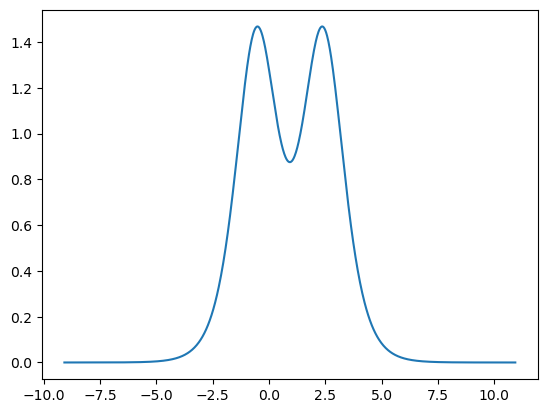

In [4]:
plt.plot(xarr, u[0, :])



In [50]:
u.shape

(100, 1000)

In [20]:
u.shape

(100, 1000)

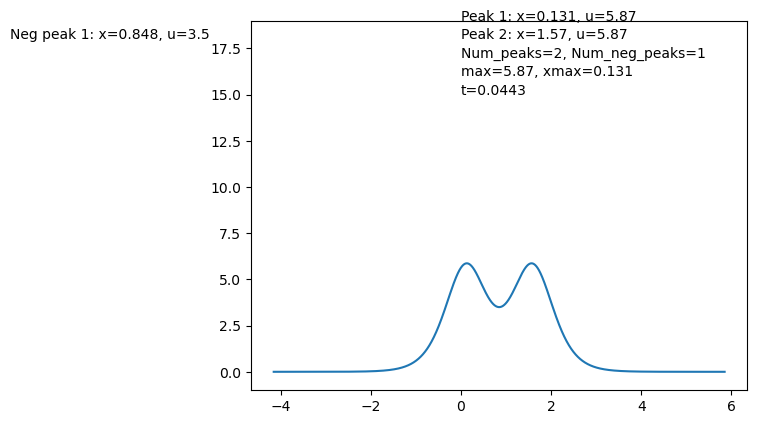

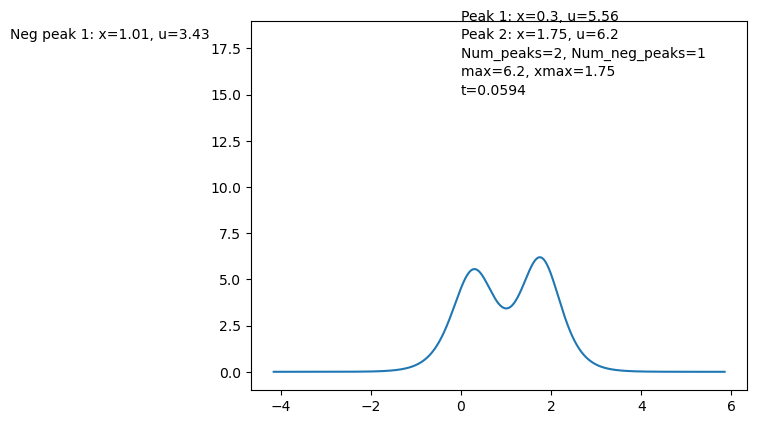

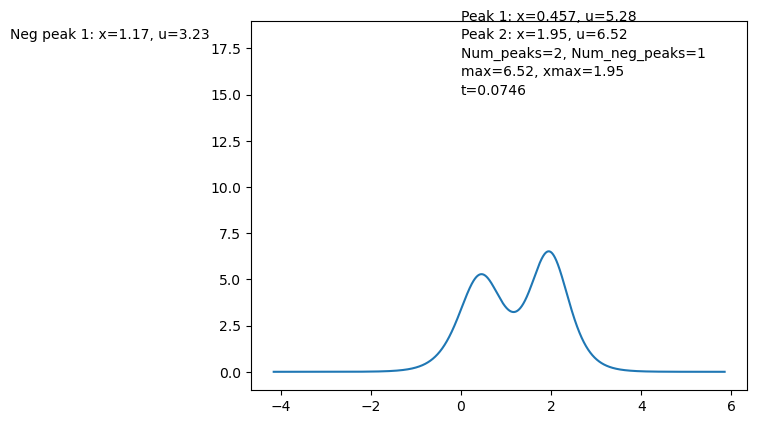

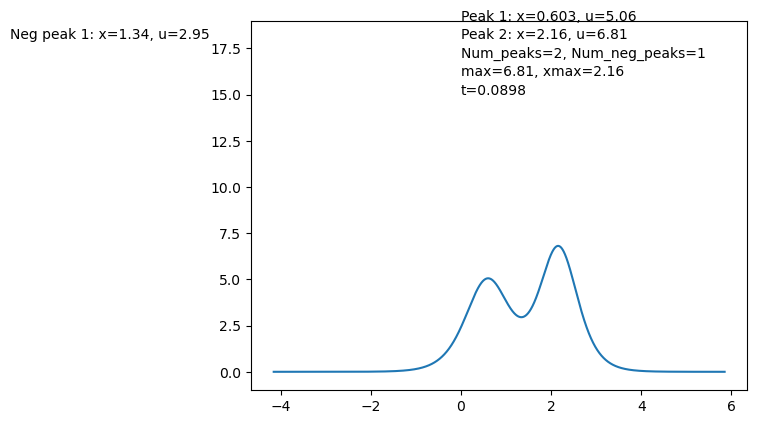

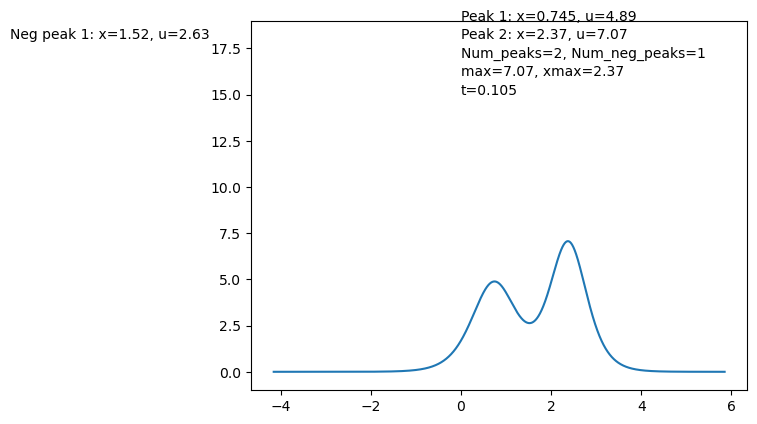

...

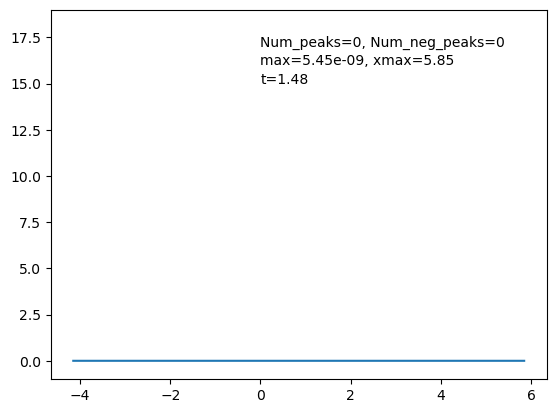

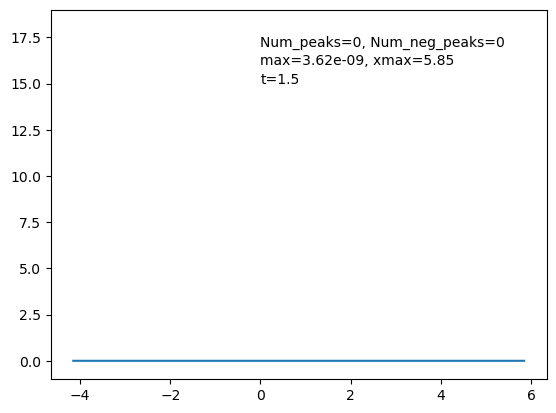

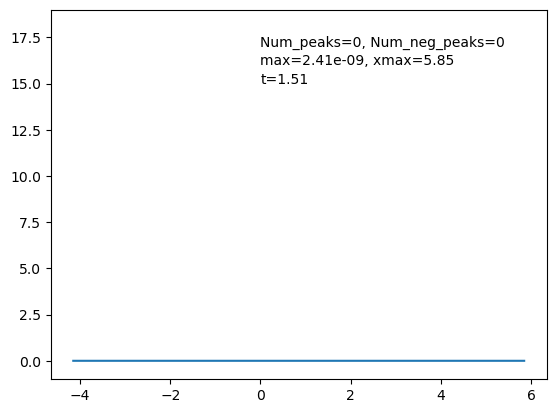

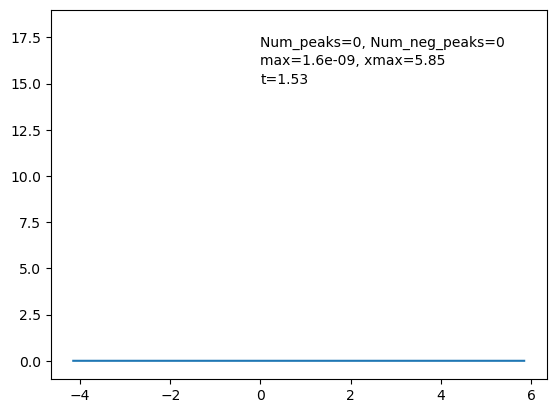

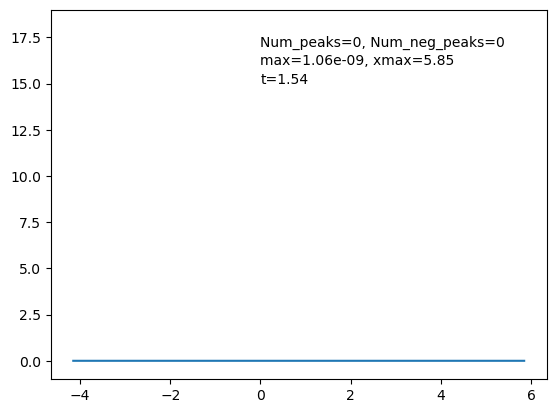

In [17]:
for (t, uarr) in zip(tarr, u):
    plt.plot(xarr, uarr)    
    plt.ylim((-1, 19))
    umax = np.max(uarr)
    xmax = xarr[np.argmax(uarr)]
    
    peaks = scipy.signal.find_peaks(uarr)
    negpeaks = scipy.signal.find_peaks(-uarr)
    
    Npeaks = peaks[0].size
    Nnegpeaks = negpeaks[0].size
        
    plt.text(0, 15, "t={:.3}".format(t))
    plt.text(0, 16, "max={:.3}, xmax={:.3}".format(umax, xmax))
    plt.text(0, 17, "Num_peaks={}, Num_neg_peaks={}".format(Npeaks, Nnegpeaks))

    for i in range(Npeaks):
        index = peaks[0][i]
        plt.text(0, 18 - i + (Npeaks - 1), "Peak {}: x={:.3}, u={:.3}".format(i + 1, xarr[index], uarr[index]))

    for i in range(Nnegpeaks):
        index = negpeaks[0][i]
        plt.text(-10, 18, "Neg peak {}: x={:.3}, u={:.3}".format(i+1, xarr[index], uarr[index]))
    plt.show()

In [11]:
np.where(theta1 <= 0)

(array([ 0,  0,  0, ..., 80, 80, 80], dtype=int64),
 array([511, 512, 513, ..., 997, 998, 999], dtype=int64))

In [18]:
myarr = np.array([1, -2, 3, -1, -2, -3]).reshape(2, 3)
myarr

array([[ 1, -2,  3],
       [-1, -2, -3]])

In [19]:
np.where(myarr <= 0)

(array([0, 1, 1, 1], dtype=int64), array([1, 0, 1, 2], dtype=int64))

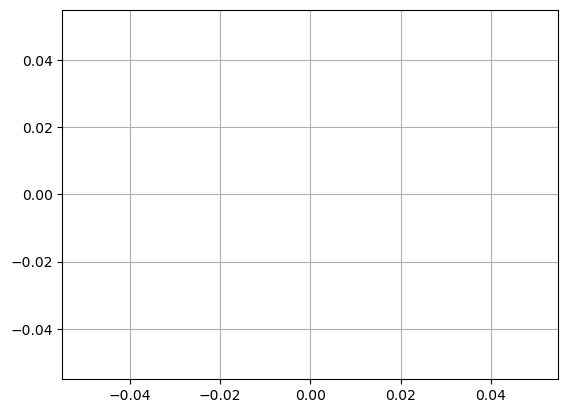

In [33]:
import itertools

import matplotlib.pyplot as plt
import numpy as np

import matplotlib.animation as animation


def data_gen():
    for cnt in itertools.count():
        t = cnt / 10
        yield t, np.sin(2*np.pi*t) * np.exp(-t/10.)


def init():
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlim(0, 1)
    del xdata[:]
    del ydata[:]
    line.set_data(xdata, ydata)
    return line,

fig, ax = plt.subplots()
line, = ax.plot([], [], lw=2)
ax.grid()
xdata, ydata = [], []


def run(data):
    # update the data
    t, y = data
    xdata.append(t)
    ydata.append(y)
    xmin, xmax = ax.get_xlim()

    if t >= xmax:
        ax.set_xlim(xmin, 2*xmax)
        ax.figure.canvas.draw()
    line.set_data(xdata, ydata)

    return line,

# Only save last 100 frames, but run forever
ani = animation.FuncAnimation(fig, run, data_gen, interval=100, init_func=init,
                              save_count=100)
plt.show()

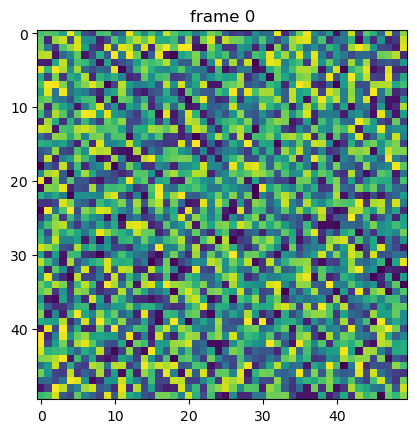

In [34]:
import matplotlib.pyplot as plt
import numpy as np

np.random.seed(19680801)
data = np.random.random((50, 50, 50))

fig, ax = plt.subplots()

for i, img in enumerate(data):
    ax.clear()
    ax.imshow(img)
    ax.set_title(f"frame {i}")
    # Note that using time.sleep does *not* work here!
    plt.pause(0.1)

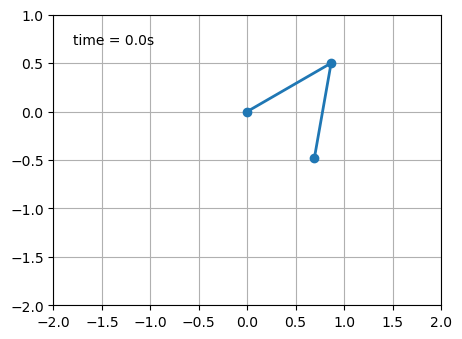

In [36]:
import matplotlib.pyplot as plt
import numpy as np
from numpy import cos, sin

import matplotlib.animation as animation

G = 9.8  # acceleration due to gravity, in m/s^2
L1 = 1.0  # length of pendulum 1 in m
L2 = 1.0  # length of pendulum 2 in m
L = L1 + L2  # maximal length of the combined pendulum
M1 = 1.0  # mass of pendulum 1 in kg
M2 = 1.0  # mass of pendulum 2 in kg
t_stop = 2.5  # how many seconds to simulate
history_len = 500  # how many trajectory points to display


def derivs(t, state):
    dydx = np.zeros_like(state)

    dydx[0] = state[1]

    delta = state[2] - state[0]
    den1 = (M1+M2) * L1 - M2 * L1 * cos(delta) * cos(delta)
    dydx[1] = ((M2 * L1 * state[1] * state[1] * sin(delta) * cos(delta)
                + M2 * G * sin(state[2]) * cos(delta)
                + M2 * L2 * state[3] * state[3] * sin(delta)
                - (M1+M2) * G * sin(state[0]))
               / den1)

    dydx[2] = state[3]

    den2 = (L2/L1) * den1
    dydx[3] = ((- M2 * L2 * state[3] * state[3] * sin(delta) * cos(delta)
                + (M1+M2) * G * sin(state[0]) * cos(delta)
                - (M1+M2) * L1 * state[1] * state[1] * sin(delta)
                - (M1+M2) * G * sin(state[2]))
               / den2)

    return dydx

# create a time array from 0..t_stop sampled at 0.02 second steps
dt = 0.01
t = np.arange(0, t_stop, dt)

# th1 and th2 are the initial angles (degrees)
# w10 and w20 are the initial angular velocities (degrees per second)
th1 = 120.0
w1 = 0.0
th2 = -10.0
w2 = 0.0

# initial state
state = np.radians([th1, w1, th2, w2])

# integrate the ODE using Euler's method
y = np.empty((len(t), 4))
y[0] = state
for i in range(1, len(t)):
    y[i] = y[i - 1] + derivs(t[i - 1], y[i - 1]) * dt

# A more accurate estimate could be obtained e.g. using scipy:
#
#   y = scipy.integrate.solve_ivp(derivs, t[[0, -1]], state, t_eval=t).y.T

x1 = L1*sin(y[:, 0])
y1 = -L1*cos(y[:, 0])

x2 = L2*sin(y[:, 2]) + x1
y2 = -L2*cos(y[:, 2]) + y1

fig = plt.figure(figsize=(5, 4))
ax = fig.add_subplot(autoscale_on=False, xlim=(-L, L), ylim=(-L, 1.))
ax.set_aspect('equal')
ax.grid()

line, = ax.plot([], [], 'o-', lw=2)
trace, = ax.plot([], [], '.-', lw=1, ms=2)
time_template = 'time = %.1fs'
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)


def animate(i):
    thisx = [0, x1[i], x2[i]]
    thisy = [0, y1[i], y2[i]]

    history_x = x2[:i]
    history_y = y2[:i]

    line.set_data(thisx, thisy)
    trace.set_data(history_x, history_y)
    time_text.set_text(time_template % (i*dt))
    return line, trace, time_text


ani = animation.FuncAnimation(
    fig, animate, len(y), interval=dt*1000, blit=True)
plt.show()

Error in callback <function _draw_all_if_interactive at 0x000002157A3CB790> (for post_execute):


AttributeError: 'ArtistList' object has no attribute 'clear'

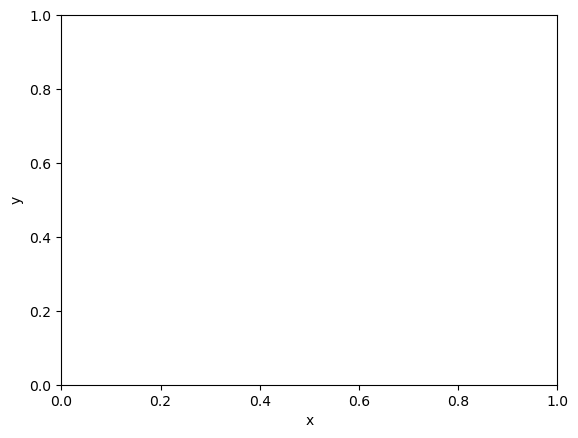

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation


x = np.arange(-0.5, 10, 1)
y = np.arange(4.5, 11, 1)

fig, ax = plt.subplots()
ax.set_xlabel("x")
ax.set_ylabel("y")

def plotheatmap(k):
    z = np.random.rand(6, 10)
    # clear the previously added heatmaps
    ax.collections.clear()
    # add a new heatmap
    ax.pcolormesh(x, y, z)
    ax.set_title(f"Temperature at t = {k:.3f} unit time")

def animate(k): 
    plotheatmap(k)

M = 10
anim = FuncAnimation(fig, animate, interval=200, frames=M+1)

In [38]:
#Import Tools
import numpy as np
import scipy.integrate as integrate
import matplotlib.pyplot as plt
from numpy import linalg as lin
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation

#Create 2D meshgrid in Cartesian Space
xL = 2*np.pi
xNUMsteps = 40
deltaX = xL/xNUMsteps
xVEC = np.linspace(0,xL,xNUMsteps+1)
xVEC = xVEC[0:-1]

yL = 2*np.pi
yNUMsteps =40
deltaY = yL/yNUMsteps
yVEC = np.linspace(0,yL,yNUMsteps+1)
yVEC = yVEC[0:-1]

X,Y = np.complex_(np.meshgrid(xVEC,yVEC))

#Create 2D meshgrid in Fourier Space
deltaK_x = (2_np.pi)/xL
xKvec_1 = np.arange(0,(xNUMsteps+1)/2)
xKvec_2 = -1_xKvec_1[::-1][1:-1]
xKvec = deltaK_x*(np.concatenate((xKvec_1,xKvec_2)))

deltaK_y = (2_np.pi)/yL
yKvec_1 = np.arange(0,(yNUMsteps+1)/2)
yKvec_2 = -1_yKvec_1[::-1][1:-1]
yKvec = deltaK_y*(np.concatenate((yKvec_1,yKvec_2)))

yK,xK = np.complex_(np.meshgrid(yKvec,xKvec))

#Construct K2
K2 = (xK * xK) + (yK * yK)
K2[0,0] = (10 ** 64)

#Discretize Time
time = 13.5*np.pi
tNUMsteps = 1200
tDelta = time/tNUMsteps
tVEC = np.complex_(np.linspace(0,time,tNUMsteps+1))

#Initialize two circular vorticies
Gamma1 = 2.5_np.pi
Gamma2 = 2.5_np.pi
Gamma3 = 2.5_np.pi
vortexONE = np.exp( (-20_(X-xL/2+xL/7)*2) - (20(Y-yL/1.7)**2) )
vortexTWO = np.exp( (-20_(X-xL/2-xL/7)2) - (20(Y-yL/1.7)*2) )
vortexTHREE = np.exp( (-12(X-xL/2)**2) - (12(Y-yL/1.7 + yL/4)_*2) )
vORT = Gamma1 * vortexONE + Gamma2 * vortexTWO + Gamma3 * vortexTHREE

##Compute all initial terms of PDE
kinVisc = .0025
visc1 = np.exp(-1 * kinVisc * K2 * tDelta)
visc2 = np.exp(-1 * kinVisc * K2 * tDelta /2)

vORTstore = np.complex_(np.zeros((len(xVEC),len(yVEC),len(tVEC))))
vORTstore[:,:,0] = vORT
vORT_f = np.fft.fft2(vORT)
eta_f_OLD = np.zeros((len(X),len(Y)))

#Integrate vorticity through time
for i in range(len(tVEC)-1):
psi_f = vORT_f/K2
vX = np.fft.ifft2(1j * yK * psi_f)
vY = np.fft.ifft2(-1j * xK * psi_f)
gradVortX = np.fft.ifft2(1j * xK * vORT_f)
gradVortY = np.fft.ifft2(1j * yK * vORT_f)
eta_f = np.fft.fft2(-vX_gradVortX-vY_gradVortY)
if i == 0:
eta_f_OLD = eta_f
vORT_f = (vORT_f * visc1) + ((tDelta/2)_(3_eta_f - eta_f_OLD)*visc2)
eta_f_OLD = eta_f
vORTstore[:,:,i+1] = np.fft.ifft2(vORT_f)

#Animate
vORTmovie = np.zeros((len(xVEC),len(yVEC),np.int(len(tVEC)/50)))
for i in range(len(vORTstore[0,0,:])-1):
if np.mod(i,50) == 0:
vORTmovie[:,:,i/50] = vORTstore[:,:,i]

Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)

def data(i,vORTmovie,line):
ax.clear()
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
ax.set_zlabel(r'$vorticity$')
set_elev = 50
set_az = 340
ax.view_init(elev=set_elev, azim=set_az)
ax.dist = 10
ax.set_zlim(-4.5,4.5)
line = ax.plot_surface(X,Y,vORTmovie[:,:,i],cmap=plt.cm.pink,rstride=1,cstride=1,linewidth=.00001,antialiased=True)
return line,

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
ax.set_zlabel(r'$vorticity$')
set_elev = 50
set_az = 340
ax.view_init(elev=set_elev, azim=set_az)
ax.dist = 10
ax.set_zlim(-4.5,4.5)
line = ax.plot_surface(X,Y,vORTmovie[:,:,0],cmap=plt.cm.pink,rstride=1,cstride=1,linewidth=.00001,antialiased=True)

ani = animation.FuncAnimation(fig, data,np.arange(1,len(vORTmovie[0,0,:])), fargs=(vORTmovie, line), interval=1)
ani.save('ThreeVortices.mp4', writer=writer)

plt.show()

SyntaxError: invalid decimal literal (1794304366.py, line 25)

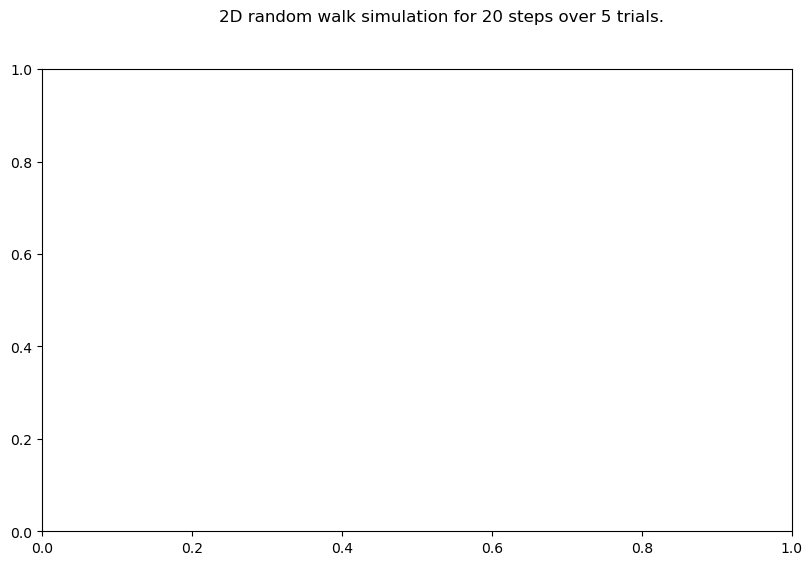

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

stepsize = 0.5
num_steps = 20
num_trials = 5

final_position = []

for _ in range(num_trials):
    pos = np.array([0, 0])
    path = []
    for i in range(num_steps):
        pos = pos + np.random.normal(0, stepsize, 2)
        path.append(pos)
    final_position.append(np.array(path))
    
x = [final_position[i][:,0] for i in range(len(final_position))]
y = [final_position[j][:,1] for j in range(len(final_position))]

fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot()
fig.subplots_adjust(left=0.1, right=0.85)

cmap = plt.get_cmap('tab10')

def animate(frame):
    step_num = frame % (num_steps)
    trial_num = frame//(num_steps)
    color = cmap(trial_num % 10)
    if step_num == num_steps-1:
        label = f"Trial = {trial_num+1}"
    else:
        label = None
    ax.plot(x[trial_num][:step_num], y[trial_num][:step_num], color = color, ls = '-',linewidth = 0.5,
            marker = 'o', ms = 8, mfc = color, mec ='k', zorder = trial_num, label = label)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f"Number of trials = {trial_num+1} \nNumber of steps = {step_num+1}")  
    if step_num == num_steps-1:
        ax.legend(fontsize=10, loc='upper left', bbox_to_anchor=(1, 1))
    ax.grid(True)
    
    return ax

fig.suptitle(f"2D random walk simulation for {num_steps} steps over {num_trials} trials.")
ani = FuncAnimation(fig, animate, frames= np.arange(0, (num_steps * num_trials)), interval = 100, repeat = False)
# ani.save('2Drandom_walkfinal.gif', writer = 'pillow')
plt.show()

In [51]:
import ipympl

%matplotlib widget

from mpl_toolkits.mplot3d import Axes3D

import matplotlib.pyplot as plt

ModuleNotFoundError: No module named 'ipympl'

In [58]:
%matplotlib ipympl


In [57]:
%pip install ipympl

     -------------------------------------- 511.6/511.6 kB 5.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [2]:
%pip


Usage:   
  C:\ProgramData\Anaconda3\python.exe -m pip <command> [options]

Commands:
  install                     Install packages.
  download                    Download packages.
  uninstall                   Uninstall packages.
  freeze                      Output installed packages in requirements format.
  inspect                     Inspect the python environment.
  list                        List installed packages.
  show                        Show information about installed packages.
  check                       Verify installed packages have compatible dependencies.
  config                      Manage local and global configuration.
  search                      Search PyPI for packages.
  cache                       Inspect and manage pip's wheel cache.
  index                       Inspect information available from package indexes.
  wheel                       Build wheels from your requirements.
  hash                        Compute hashes of package archives.
  

In [3]:
%pip list

Note: you may need to restart the kernel to use updated packages.
Package                       Version
----------------------------- -------------------
absl-py                       0.13.0
alabaster                     0.7.12
anaconda-client               1.11.2
anaconda-navigator            2.4.0
anyio                         3.5.0
appdirs                       1.4.4
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.3
astroid                       2.14.2
astropy                       5.1
asttokens                     2.0.5
astunparse                    1.6.3
atomicwrites                  1.4.0
attrs                         22.1.0
Automat                       20.2.0
autopep8                      1.6.0
Babel                         2.11.0
backcall                      0.2.0
backports.functools-lru-cache 1.6.4
backports.tempfile            1.0
backports.weakref             1.0.post1
bcrypt                        3.2.0
beautiful

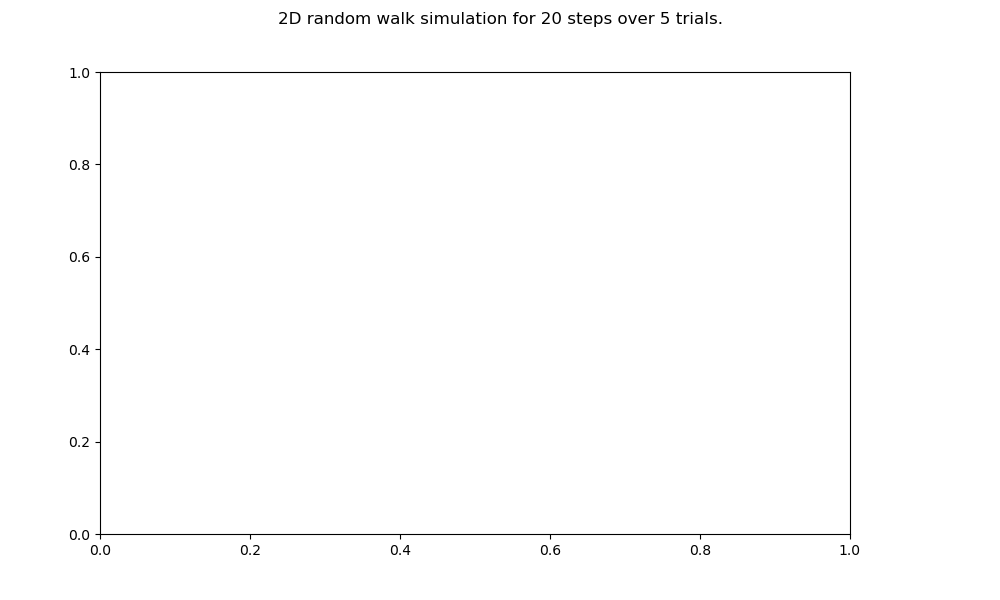

In [1]:
%matplotlib ipympl
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

stepsize = 0.5
num_steps = 20
num_trials = 5

final_position = []

for _ in range(num_trials):
    pos = np.array([0, 0])
    path = []
    for i in range(num_steps):
        pos = pos + np.random.normal(0, stepsize, 2)
        path.append(pos)
    final_position.append(np.array(path))
    
x = [final_position[i][:,0] for i in range(len(final_position))]
y = [final_position[j][:,1] for j in range(len(final_position))]

fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot()
fig.subplots_adjust(left=0.1, right=0.85)

cmap = plt.get_cmap('tab10')

def animate(frame):
    step_num = frame % (num_steps)
    trial_num = frame//(num_steps)
    color = cmap(trial_num % 10)
    if step_num == num_steps-1:
        label = f"Trial = {trial_num+1}"
    else:
        label = None
    ax.plot(x[trial_num][:step_num], y[trial_num][:step_num], color = color, ls = '-',linewidth = 0.5,
            marker = 'o', ms = 8, mfc = color, mec ='k', zorder = trial_num, label = label)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f"Number of trials = {trial_num+1} \nNumber of steps = {step_num+1}")  
    if step_num == num_steps-1:
        ax.legend(fontsize=10, loc='upper left', bbox_to_anchor=(1, 1))
    ax.grid(True)
    
    return ax

fig.suptitle(f"2D random walk simulation for {num_steps} steps over {num_trials} trials.")
ani = FuncAnimation(fig, animate, frames= np.arange(0, (num_steps * num_trials)), interval = 100, repeat = False)
ani;

https://discourse.jupyter.org/t/matplotlib-animation-not-appearing-in-jupyter-notebook/24938/5

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
plt.rcParams["animation.html"] = "jshtml"
plt.ioff() #needed so the second time you run it you get only single plot

stepsize = 0.5
num_steps = 20
num_trials = 5

final_position = []

for _ in range(num_trials):
    pos = np.array([0, 0])
    path = []
    for i in range(num_steps):
        pos = pos + np.random.normal(0, stepsize, 2)
        path.append(pos)
    final_position.append(np.array(path))
    
x = [final_position[i][:,0] for i in range(len(final_position))]
y = [final_position[j][:,1] for j in range(len(final_position))]

fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot()
fig.subplots_adjust(left=0.1, right=0.85)

cmap = plt.get_cmap('tab10')

def animate(frame):
    step_num = frame % (num_steps)
    trial_num = frame//(num_steps)
    color = cmap(trial_num % 10)
    if step_num == num_steps-1:
        label = f"Trial = {trial_num+1}"
    else:
        label = None
    ax.plot(x[trial_num][:step_num], y[trial_num][:step_num], color = color, ls = '-',linewidth = 0.5,
            marker = 'o', ms = 8, mfc = color, mec ='k', zorder = trial_num, label = label)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f"Number of trials = {trial_num+1} \nNumber of steps = {step_num+1}")  
    if step_num == num_steps-1:
        ax.legend(fontsize=10, loc='upper left', bbox_to_anchor=(1, 1))
    ax.grid(True)
    
    return ax

fig.suptitle(f"2D random walk simulation for {num_steps} steps over {num_trials} trials.")
ani = FuncAnimation(fig, animate, frames= np.arange(0, (num_steps * num_trials)), interval = 100, repeat = False)
ani

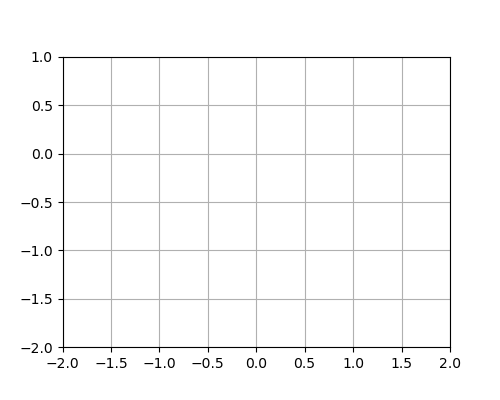

In [11]:
import matplotlib.pyplot as plt
import numpy as np
from numpy import cos, sin

import matplotlib.animation as animation

G = 9.8  # acceleration due to gravity, in m/s^2
L1 = 1.0  # length of pendulum 1 in m
L2 = 1.0  # length of pendulum 2 in m
L = L1 + L2  # maximal length of the combined pendulum
M1 = 1.0  # mass of pendulum 1 in kg
M2 = 1.0  # mass of pendulum 2 in kg
t_stop = 2.5  # how many seconds to simulate
history_len = 500  # how many trajectory points to display


def derivs(t, state):
    dydx = np.zeros_like(state)

    dydx[0] = state[1]

    delta = state[2] - state[0]
    den1 = (M1+M2) * L1 - M2 * L1 * cos(delta) * cos(delta)
    dydx[1] = ((M2 * L1 * state[1] * state[1] * sin(delta) * cos(delta)
                + M2 * G * sin(state[2]) * cos(delta)
                + M2 * L2 * state[3] * state[3] * sin(delta)
                - (M1+M2) * G * sin(state[0]))
               / den1)

    dydx[2] = state[3]

    den2 = (L2/L1) * den1
    dydx[3] = ((- M2 * L2 * state[3] * state[3] * sin(delta) * cos(delta)
                + (M1+M2) * G * sin(state[0]) * cos(delta)
                - (M1+M2) * L1 * state[1] * state[1] * sin(delta)
                - (M1+M2) * G * sin(state[2]))
               / den2)

    return dydx

# create a time array from 0..t_stop sampled at 0.02 second steps
dt = 0.01
t = np.arange(0, t_stop, dt)

# th1 and th2 are the initial angles (degrees)
# w10 and w20 are the initial angular velocities (degrees per second)
th1 = 120.0
w1 = 0.0
th2 = -10.0
w2 = 0.0

# initial state
state = np.radians([th1, w1, th2, w2])

# integrate the ODE using Euler's method
y = np.empty((len(t), 4))
y[0] = state
for i in range(1, len(t)):
    y[i] = y[i - 1] + derivs(t[i - 1], y[i - 1]) * dt

# A more accurate estimate could be obtained e.g. using scipy:
#
#   y = scipy.integrate.solve_ivp(derivs, t[[0, -1]], state, t_eval=t).y.T

x1 = L1*sin(y[:, 0])
y1 = -L1*cos(y[:, 0])

x2 = L2*sin(y[:, 2]) + x1
y2 = -L2*cos(y[:, 2]) + y1

fig = plt.figure(figsize=(5, 4))
ax = fig.add_subplot(autoscale_on=False, xlim=(-L, L), ylim=(-L, 1.))
ax.set_aspect('equal')
ax.grid()

line, = ax.plot([], [], 'o-', lw=2)
trace, = ax.plot([], [], '.-', lw=1, ms=2)
time_template = 'time = %.1fs'
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)


def animate(i):
    thisx = [0, x1[i], x2[i]]
    thisy = [0, y1[i], y2[i]]

    history_x = x2[:i]
    history_y = y2[:i]

    line.set_data(thisx, thisy)
    trace.set_data(history_x, history_y)
    time_text.set_text(time_template % (i*dt))
    return line, trace, time_text


ani = animation.FuncAnimation(fig, animate, len(y), interval=dt*1000, blit=True)
plt.show()

In [48]:
import matplotlib
matplotlib.__version__

'3.7.0'

In [27]:
1/3**(1/2)

0.5773502691896258

In [55]:
np.random.seed(3)
myarr = np.random.rand(10000000)

In [56]:
import time
import numpy as np

start = time.time()
# first define the function
def vector_function(x, y):
    if y >= x:
        return x * y
    else:
        return x / y

# vectorize it
vfunc = np.vectorize(vector_function)

# validation
vfunc(myarr, 2.5) # [2.5 5.  1.2 1.6]

end = time.time()
print(end - start)

2.2002968788146973


In [57]:
start = time.time()

def foo(x,y):
    return np.where(y>=x, x*y, x/y)



foo(myarr, 2.5)

end = time.time()
print(end - start)

0.11255335807800293


In [27]:
np.random.rand(10)

array([0.11142622, 0.48050538, 0.32768178, 0.77272526, 0.33644862,
       0.08830253, 0.91388711, 0.25738384, 0.85962382, 0.84026502])

In [29]:
np.random.rand(10)

array([0.91627759, 0.27282475, 0.37841792, 0.71816142, 0.59412499,
       0.54024455, 0.15046801, 0.90365278, 0.77825603, 0.43324603])

In [30]:
np.random.seed(3)
np.random.rand(10)

array([0.5507979 , 0.70814782, 0.29090474, 0.51082761, 0.89294695,
       0.89629309, 0.12558531, 0.20724288, 0.0514672 , 0.44080984])

In [31]:
np.random.seed(3)
np.random.rand(10)

array([0.5507979 , 0.70814782, 0.29090474, 0.51082761, 0.89294695,
       0.89629309, 0.12558531, 0.20724288, 0.0514672 , 0.44080984])

In [32]:
np.random.seed(3)
np.random.rand(10)

array([0.5507979 , 0.70814782, 0.29090474, 0.51082761, 0.89294695,
       0.89629309, 0.12558531, 0.20724288, 0.0514672 , 0.44080984])

In [7]:
import numpy as np

In [12]:
def myfunc(a, b):
    print("Hello")
    if (a > b):
        return (a+b)
    else:
        return a / b

In [13]:
myfunc(3, 2)

Hello


5

In [14]:
np.vectorize(myfunc)([2, 3, 4], 3)

Hello
Hello
Hello
Hello


array([0.66666667, 1.        , 7.        ])

In [17]:
np.vectorize(myfunc, otypes=[float])([4, 3, 2], 3)

Hello
Hello
Hello


array([7.        , 1.        , 0.66666667])

In [1]:
import numpy as np

In [3]:
def myfunc(a, b):
    print("Hello")
    res = np.zeros((2, 3))
    res[0][0] = a
    res[0][1] = a + b
    res[1][0] = a - b
    res[1][1] = b
    return res

In [4]:
myfunc(2, 3)

Hello


array([[ 2.,  5.,  0.],
       [-1.,  3.,  0.]])

In [9]:
np.vectorize(myfunc, signature="(3, 4), (3)->(4)")

ValueError: Invalid otype specified: (

In [12]:
import scipy.stats

pearsonr = np.vectorize(scipy.stats.pearsonr, signature='(n),(n)->(),()')

pearsonr([[0, 1, 2, 3]], [[1, 2, 3, 4], [4, 3, 2, 1]])

(array([ 1., -1.]), array([0., 0.]))

In [17]:
scipy.stats.pearsonr([2, 3], [4, 32])

PearsonRResult(statistic=1.0, pvalue=1.0)

In [19]:
scipy.stats.pearsonr([[0, 1, 2, 3]], [[4, 3, 2, 1]])

ValueError: x and y must have length at least 2.

In [42]:
def f(x):
    return (x * np.array([1,1,1,1,1, 1], dtype=np.float32)).reshape(2, 3)

g = np.vectorize(f, signature='()->(t, m)')

print(f(765))

print(g([1, 2]))

[[765. 765. 765.]
 [765. 765. 765.]]
[[[1. 1. 1.]
  [1. 1. 1.]]

 [[2. 2. 2.]
  [2. 2. 2.]]]


(5,)

In [27]:
g([1, 2]).shape

(2, 5)